In [1]:
import sys
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchviz import make_dot
import numpy as np
from collections import deque
import random
import pygame as PG
import pandas as pd
import matplotlib.pyplot as plt

pygame 2.6.0 (SDL 2.28.4, Python 3.11.6)
Hello from the pygame community. https://www.pygame.org/contribute.html


# Visualization

### DQN

In [4]:
# Loading the model
def load_model():
    # Directory where your model files are stored
    model_directory = "../../Model/DQN/"

    # Get a list of all files in the directory
    all_files = os.listdir(model_directory)

    # Filter out only the model files (assuming they all have the .pth extension)
    model_files = [f for f in all_files if f.endswith('.pth')]

    # Initialize an empty list to store models
    models = []

    # Load each model and append to the list
    for model_file in sorted(model_files):
        model_path = os.path.join(model_directory, model_file)
        model = torch.load(model_path, map_location='cuda', weights_only=False)  # Load the model
        models.append(model)  # Append the loaded model to the list

    return models


def load_single_model():
    filename = "Model_at_episode_0.pth"
    model_path = os.path.join('../../Model/DQN/', filename)  # Adjusted path
    checkpoint = torch.load(model_path, map_location='cuda', weights_only=True)
    return checkpoint

In [5]:
models = load_model()
# model = load_single_model()

In [6]:
models_df = pd.DataFrame(models)
# model_df = pd.DataFrame(model)

In [7]:
models_df.keys()

Index(['episode_count', 'policy_net_state_dict', 'target_net_state_dict',
       'epsilon', 'epsilon_decay', 'epsilon_min', 'total_reward',
       'episode_reward', 'memory'],
      dtype='object')

In [13]:
models_df['memory'][30].memory

deque([Transition(state=array([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
               1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  0,  0,  0,  0,  0,
               0,  0,  0,  0,  0,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,
               0,  0,  0,  0,  1,  1,  0,  1,  1,  1,  1,  0,  1,  1,  1,  1,  1,
               0,  1,  1,  0,  1,  1,  1,  1,  1,  0,  1,  1,  1,  1,  0,  1,  1,
               8,  1,  1,  1,  1,  0,  1,  1,  1,  1,  1,  0,  1,  1,  0,  1,  1,
               1,  1,  1,  0,  1,  1,  1,  1,  8,  1,  1,  0,  1,  1,  1,  1,  0,
               1,  1,  1,  1,  1,  0,  1,  1,  0,  1,  1,  1,  1,  1,  0,  1,  1,
               1,  1,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
               0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  0,
               1,  1,  1,  1,  0,  1,  1,  0,  1,  1,  1,  1,  1,  1,  1,  1,  0,
               1,  1,  0,  1,  1,  1,  1,  0,  1,  1,  0,  1,  1,  1,  1,  0,  1,

In [15]:
print(models_df['policy_net_state_dict'][0]['fc1.weight'])
print(models_df['policy_net_state_dict'][30]['fc1.weight'])

tensor([[-0.0014,  0.0209,  0.0311,  ..., -0.0222, -0.0051,  0.0320],
        [-0.0270,  0.0325, -0.0211,  ...,  0.0034, -0.0124,  0.0091],
        [ 0.0101, -0.0157, -0.0079,  ...,  0.0094,  0.0135,  0.0102],
        ...,
        [ 0.0180, -0.0040,  0.0092,  ...,  0.0143, -0.0002,  0.0230],
        [-0.0199, -0.0303,  0.0085,  ..., -0.0419,  0.0089, -0.0230],
        [ 0.0240, -0.0370, -0.0353,  ..., -0.0302, -0.0232, -0.0279]],
       device='cuda:0')
tensor([[-3.6265e-02, -1.3973e-02, -3.7398e-03,  ..., -1.2354e-01,
         -1.0640e-01, -6.9380e-02],
        [-4.8470e-02,  1.1042e-02, -4.2607e-02,  ..., -2.0791e-02,
         -3.6613e-02, -1.5130e-02],
        [-1.8998e-03, -2.7721e-02, -1.9907e-02,  ...,  1.0386e-02,
          1.4517e-02,  1.1215e-02],
        ...,
        [ 1.5049e-01,  1.2841e-01,  1.4166e-01,  ..., -4.3253e+01,
         -4.0168e+01, -3.7375e+01],
        [-2.2035e-01, -2.3073e-01, -1.9195e-01,  ..., -2.2284e+01,
         -2.3920e+01, -2.2613e+01],
        [-9.79

In [16]:
print(models_df['total_reward'][0])

[-6.6]


In [17]:
print(models_df['memory'][0].memory)

deque([Transition(state=array([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  1,  1,  0,  1,  1,  1,  1,  0,  1,  1,  1,  1,  1,
        0,  1,  1,  0,  1,  1,  1,  1,  1,  0,  1,  1,  1,  1,  0,  1,  1,
        8,  1,  1,  1,  1,  0,  1,  1,  1,  1,  1,  0,  1,  1,  0,  1,  1,
        1,  1,  1,  0,  1,  1,  1,  1,  8,  1,  1,  0,  1,  1,  1,  1,  0,
        1,  1,  1,  1,  1,  0,  1,  1,  0,  1,  1,  1,  1,  1,  0,  1,  1,
        1,  1,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  0,
        1,  1,  1,  1,  0,  1,  1,  0,  1,  1,  1,  1,  1,  1,  1,  1,  0,
        1,  1,  0,  1,  1,  1,  1,  0,  1,  1,  0,  1,  1,  1,  1,  0,  1,
        1,  0,  1,  1,  1,  1,  1,  1,  1,  1,  0,  1,  1,  0,  1,  1,  1,
 

In [19]:
print(models_df['memory'][5].memory)

### DDQN

In [13]:
# Loading the model
def load_model():
    # Directory where your model files are stored
    model_directory = "../../Model/DDQN/First"

    # Get a list of all files in the directory
    all_files = os.listdir(model_directory)

    # Filter out only the model files (assuming they all have the .pth extension)
    model_files = [f for f in all_files if f.endswith('.pth')]

    # Initialize an empty list to store models
    models = []

    # Load each model and append to the list
    for model_file in sorted(model_files):
        model_path = os.path.join(model_directory, model_file)
        model = torch.load(model_path, map_location='cuda', weights_only=False)  # Load the model
        models.append(model)  # Append the loaded model to the list

    return models

def load_csv(subfolder):
    df_path = os.path.join('../../Model/DDQN', subfolder, "reward.csv")
    df = pd.read_csv(df_path)
    df.head()
    return df

In [14]:
df = load_csv('Second')
df.head()

,Episode,Reward,Epsilon
0,0,0.31,1.000000
1,1,6.16,0.999000
2,2,0.31,0.998001
3,3,11.81,0.997003
4,4,4.66,0.996006


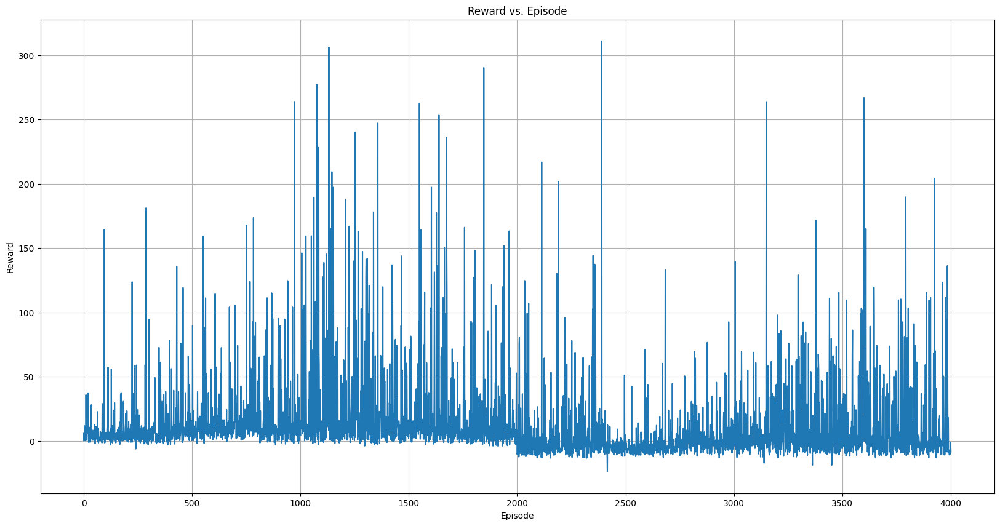

In [15]:
plt.figure(figsize= (20,10))

# plt.plot(df['Episode'], df['Reward'], marker='o', linestyle='-', color='b')
plt.plot(df['Episode'], df['Reward'], linestyle='-')
# plt.plot(df['Episode'], df['Epsilon'], linestyle='-', color= 'b')

# Add labels and title
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('Reward vs. Episode')

# Display the plot
plt.grid(True)
plt.show()

In [8]:
print(df['Reward'].max())
print(df['Reward'].min())

310.91
-13.32
